#### Variable to be considered

<p>The target is Approved_Flag and the possible values it can contain are:

P1: Very Good Creditworthiness <br>
P2: Good Creditworthiness <br>
P3: Okay Creditworthiness <br>
P4: Bad Creditworthiness<br>

 <p> 

In [9]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
df = pd.read_excel('Data/case_study1.xlsx')

In [5]:
df  

,PROSPECTID,Total_TL,Tot_Closed_TL,Tot_Active_TL,Total_TL_opened_L6M,Tot_TL_closed_L6M,pct_tl_open_L6M,pct_tl_closed_L6M,pct_active_tl,pct_closed_tl,...,CC_TL,Consumer_TL,Gold_TL,Home_TL,PL_TL,Secured_TL,Unsecured_TL,Other_TL,Age_Oldest_TL,Age_Newest_TL
0,1,5,4,1,0,0,0.000,0.00,0.200,0.800,...,0,0,1,0,4,1,4,0,72,18
1,2,1,0,1,0,0,0.000,0.00,1.000,0.000,...,0,1,0,0,0,0,1,0,7,7
2,3,8,0,8,1,0,0.125,0.00,1.000,0.000,...,0,6,1,0,0,2,6,0,47,2
3,4,1,0,1,1,0,1.000,0.00,1.000,0.000,...,0,0,0,0,0,0,1,1,5,5
4,5,3,2,1,0,0,0.000,0.00,0.333,0.667,...,0,0,0,0,0,3,0,2,131,32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51331,51332,3,0,3,1,0,0.333,0.00,1.000,0.000,...,0,2,0,0,0,0,3,1,24,5
51332,51333,4,2,2,0,1,0.000,0.25,0.500,0.500,...,0,2,0,0,0,2,2,0,74,7
51333,51334,2,1,1,1,1,0.500,0.50,0.500,0.500,...,0,2,0,0,0,0,2,0,9,5
51334,51335,2,1,1,0,0,0.000,0.00,0.500,0.500,...,0,2,0,0,0,0,2,0,15,8


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51336 entries, 0 to 51335
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   PROSPECTID            51336 non-null  int64  
 1   Total_TL              51336 non-null  int64  
 2   Tot_Closed_TL         51336 non-null  int64  
 3   Tot_Active_TL         51336 non-null  int64  
 4   Total_TL_opened_L6M   51336 non-null  int64  
 5   Tot_TL_closed_L6M     51336 non-null  int64  
 6   pct_tl_open_L6M       51336 non-null  float64
 7   pct_tl_closed_L6M     51336 non-null  float64
 8   pct_active_tl         51336 non-null  float64
 9   pct_closed_tl         51336 non-null  float64
 10  Total_TL_opened_L12M  51336 non-null  int64  
 11  Tot_TL_closed_L12M    51336 non-null  int64  
 12  pct_tl_open_L12M      51336 non-null  float64
 13  pct_tl_closed_L12M    51336 non-null  float64
 14  Tot_Missed_Pmnt       51336 non-null  int64  
 15  Auto_TL            

In [7]:
df.describe()

,PROSPECTID,Total_TL,Tot_Closed_TL,Tot_Active_TL,Total_TL_opened_L6M,Tot_TL_closed_L6M,pct_tl_open_L6M,pct_tl_closed_L6M,pct_active_tl,pct_closed_tl,...,CC_TL,Consumer_TL,Gold_TL,Home_TL,PL_TL,Secured_TL,Unsecured_TL,Other_TL,Age_Oldest_TL,Age_Newest_TL
count,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,...,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000
mean,25668.500000,4.858598,2.770415,2.088184,0.736754,0.428919,0.184574,0.089095,0.577542,0.422458,...,0.124981,1.136084,1.561847,0.070146,0.282511,2.844904,2.013694,1.089762,-32.575639,-62.149525
std,14819.571046,7.177116,5.941680,2.290774,1.296717,0.989972,0.297414,0.205635,0.379867,0.379867,...,0.505201,2.227997,5.376434,0.340861,0.858168,6.187177,3.198322,2.417496,2791.869609,2790.818622
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-99999.000000,-99999.000000
25%,12834.750000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,4.000000
50%,25668.500000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.556000,0.444000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,33.000000,8.000000
75%,38502.250000,5.000000,3.000000,3.000000,1.000000,1.000000,0.308000,0.053000,1.000000,0.750000,...,0.000000,1.000000,1.000000,0.000000,0.000000,3.000000,2.000000,1.000000,64.000000,17.000000
max,51336.000000,235.000000,216.000000,47.000000,27.000000,19.000000,1.000000,1.000000,1.000000,1.000000,...,27.000000,41.000000,235.000000,10.000000,29.000000,235.000000,55.000000,80.000000,392.000000,392.000000


In [10]:
df.isna().sum()

PROSPECTID              0
Total_TL                0
Tot_Closed_TL           0
Tot_Active_TL           0
Total_TL_opened_L6M     0
Tot_TL_closed_L6M       0
pct_tl_open_L6M         0
pct_tl_closed_L6M       0
pct_active_tl           0
pct_closed_tl           0
Total_TL_opened_L12M    0
Tot_TL_closed_L12M      0
pct_tl_open_L12M        0
pct_tl_closed_L12M      0
Tot_Missed_Pmnt         0
Auto_TL                 0
CC_TL                   0
Consumer_TL             0
Gold_TL                 0
Home_TL                 0
PL_TL                   0
Secured_TL              0
Unsecured_TL            0
Other_TL                0
Age_Oldest_TL           0
Age_Newest_TL           0
dtype: int64

In [11]:
df.isnull().sum()

PROSPECTID              0
Total_TL                0
Tot_Closed_TL           0
Tot_Active_TL           0
Total_TL_opened_L6M     0
Tot_TL_closed_L6M       0
pct_tl_open_L6M         0
pct_tl_closed_L6M       0
pct_active_tl           0
pct_closed_tl           0
Total_TL_opened_L12M    0
Tot_TL_closed_L12M      0
pct_tl_open_L12M        0
pct_tl_closed_L12M      0
Tot_Missed_Pmnt         0
Auto_TL                 0
CC_TL                   0
Consumer_TL             0
Gold_TL                 0
Home_TL                 0
PL_TL                   0
Secured_TL              0
Unsecured_TL            0
Other_TL                0
Age_Oldest_TL           0
Age_Newest_TL           0
dtype: int64

In [12]:
df.duplicated().sum()

np.int64(0)

# Now we going to see the distibution of Data
## Univariate Analysis

array([[<Axes: title={'center': 'PROSPECTID'}>,
        <Axes: title={'center': 'Total_TL'}>,
        <Axes: title={'center': 'Tot_Closed_TL'}>,
        <Axes: title={'center': 'Tot_Active_TL'}>,
        <Axes: title={'center': 'Total_TL_opened_L6M'}>],
       [<Axes: title={'center': 'Tot_TL_closed_L6M'}>,
        <Axes: title={'center': 'pct_tl_open_L6M'}>,
        <Axes: title={'center': 'pct_tl_closed_L6M'}>,
        <Axes: title={'center': 'pct_active_tl'}>,
        <Axes: title={'center': 'pct_closed_tl'}>],
       [<Axes: title={'center': 'Total_TL_opened_L12M'}>,
        <Axes: title={'center': 'Tot_TL_closed_L12M'}>,
        <Axes: title={'center': 'pct_tl_open_L12M'}>,
        <Axes: title={'center': 'pct_tl_closed_L12M'}>,
        <Axes: title={'center': 'Tot_Missed_Pmnt'}>],
       [<Axes: title={'center': 'Auto_TL'}>,
        <Axes: title={'center': 'CC_TL'}>,
        <Axes: title={'center': 'Consumer_TL'}>,
        <Axes: title={'center': 'Gold_TL'}>,
        <Axes: title

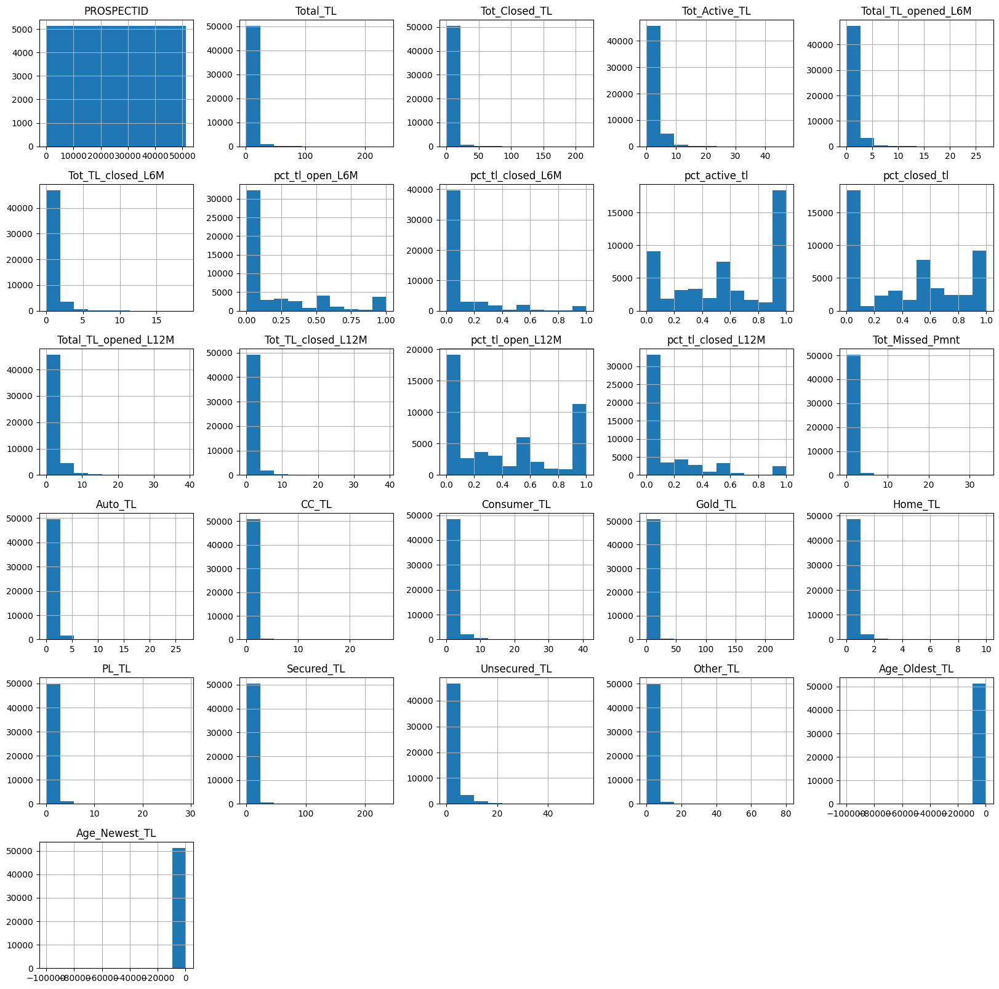

In [14]:
df.hist(figsize=(20,20))

/var/folders/g7/bbd_jzjd06dgnv3jh42k45l80000gn/T/ipykernel_66448/3338999430.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))


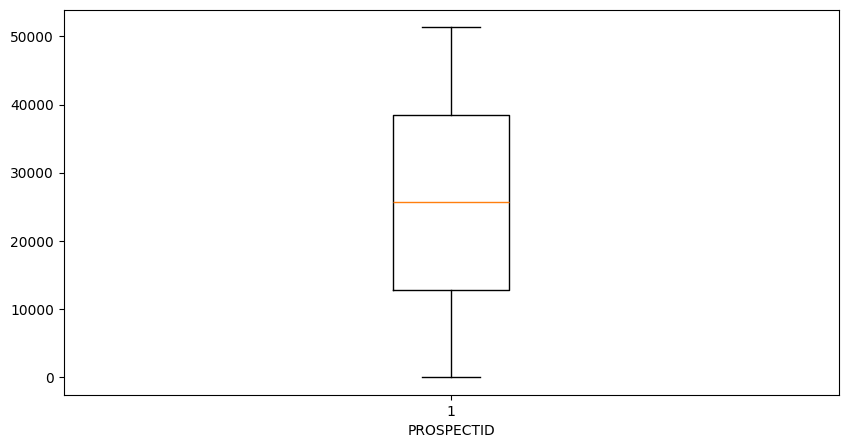

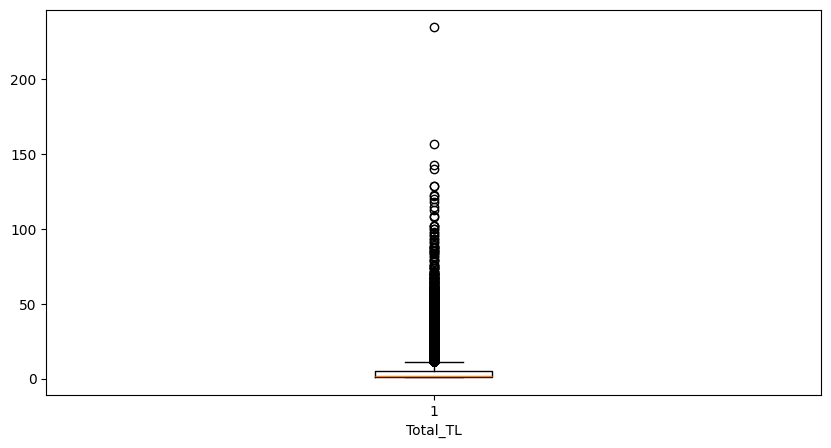

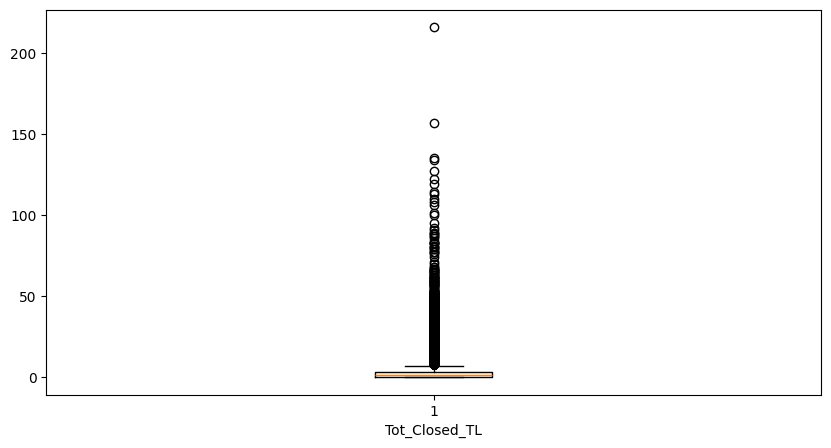

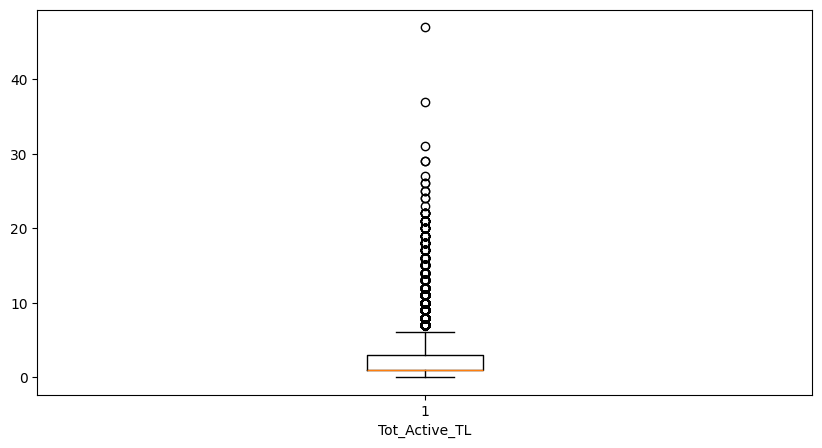

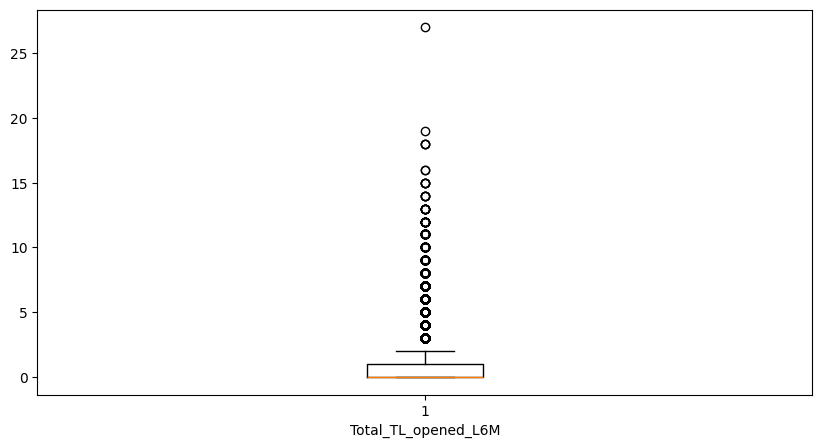

...

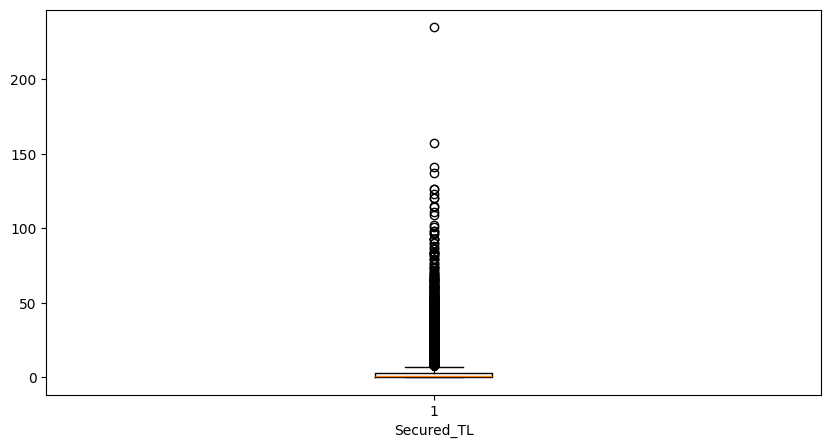

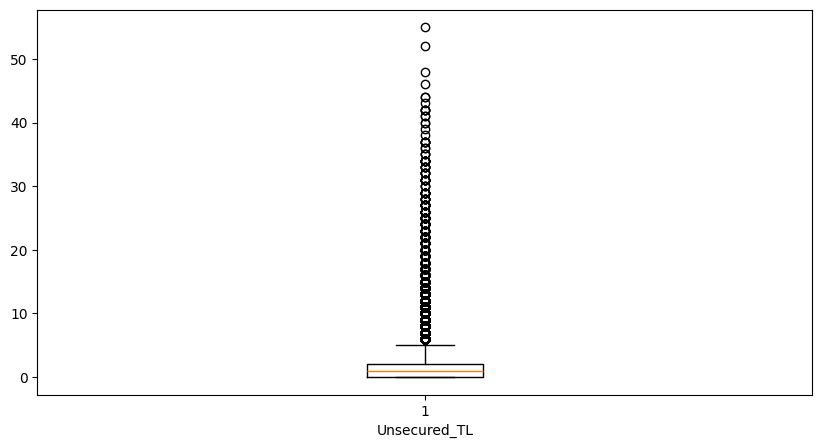

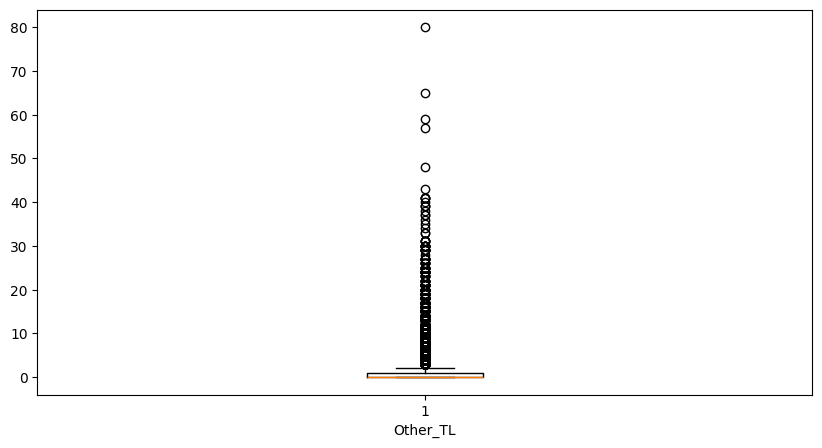

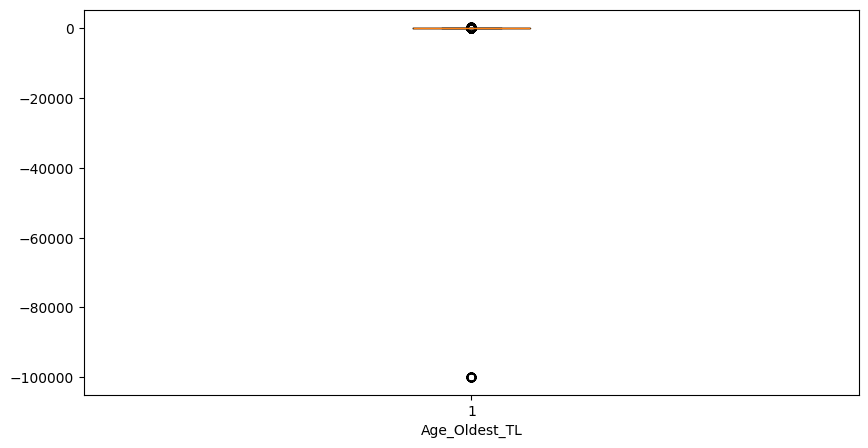

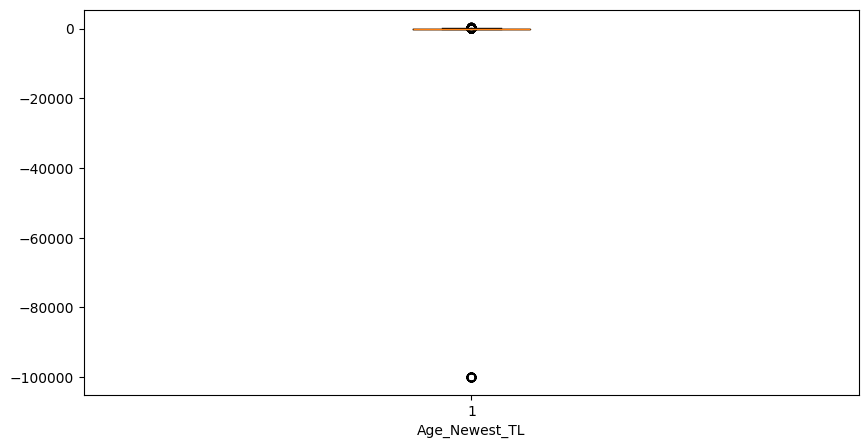

In [20]:
uniques = df.columns.to_list()
for i in uniques:
    plt.figure(figsize=(10,5))
    plt.boxplot(df[i])
    plt.xlabel(i)
#df.boxplot(column=['Total_TL'] , figsize=(20,20))

In [21]:
df.drop(columns=['Age_Oldest_TL','Age_Newest_TL'] , inplace = True)

<Axes: >

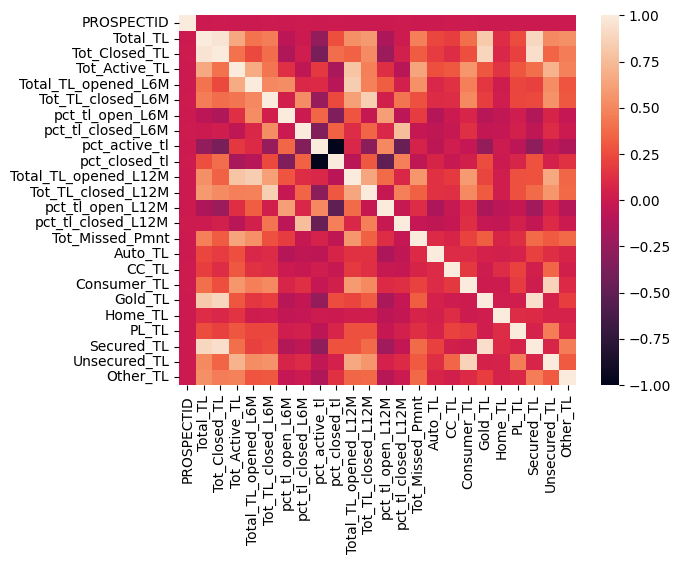

In [26]:
sns.heatmap(df.corr(), annot=False)

In [27]:
categorical_Variable = df.select_dtypes(include=['object']).columns
categorical_Variable
# We dont have any categorical variable

Index([], dtype='object')

array([[<Axes: xlabel='PROSPECTID', ylabel='PROSPECTID'>,
        <Axes: xlabel='Total_TL', ylabel='PROSPECTID'>,
        <Axes: xlabel='Tot_Closed_TL', ylabel='PROSPECTID'>,
        <Axes: xlabel='Tot_Active_TL', ylabel='PROSPECTID'>,
        <Axes: xlabel='Total_TL_opened_L6M', ylabel='PROSPECTID'>,
        <Axes: xlabel='Tot_TL_closed_L6M', ylabel='PROSPECTID'>,
        <Axes: xlabel='pct_tl_open_L6M', ylabel='PROSPECTID'>,
        <Axes: xlabel='pct_tl_closed_L6M', ylabel='PROSPECTID'>,
        <Axes: xlabel='pct_active_tl', ylabel='PROSPECTID'>,
        <Axes: xlabel='pct_closed_tl', ylabel='PROSPECTID'>,
        <Axes: xlabel='Total_TL_opened_L12M', ylabel='PROSPECTID'>,
        <Axes: xlabel='Tot_TL_closed_L12M', ylabel='PROSPECTID'>,
        <Axes: xlabel='pct_tl_open_L12M', ylabel='PROSPECTID'>,
        <Axes: xlabel='pct_tl_closed_L12M', ylabel='PROSPECTID'>,
        <Axes: xlabel='Tot_Missed_Pmnt', ylabel='PROSPECTID'>,
        <Axes: xlabel='Auto_TL', ylabel='PROSPECTID'>,


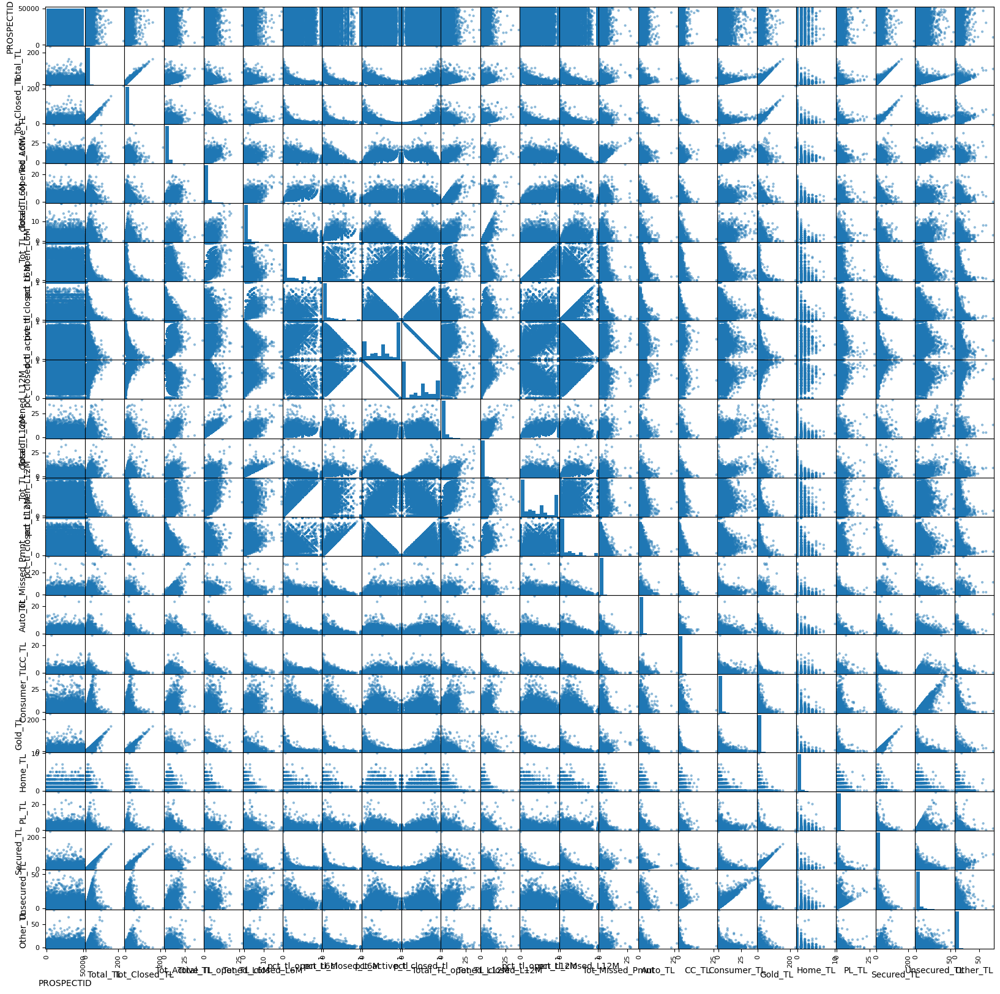

In [31]:
# Now we will check the distribution of the data base on continous variable
pd.plotting.scatter_matrix(df, figsize=(20,20))

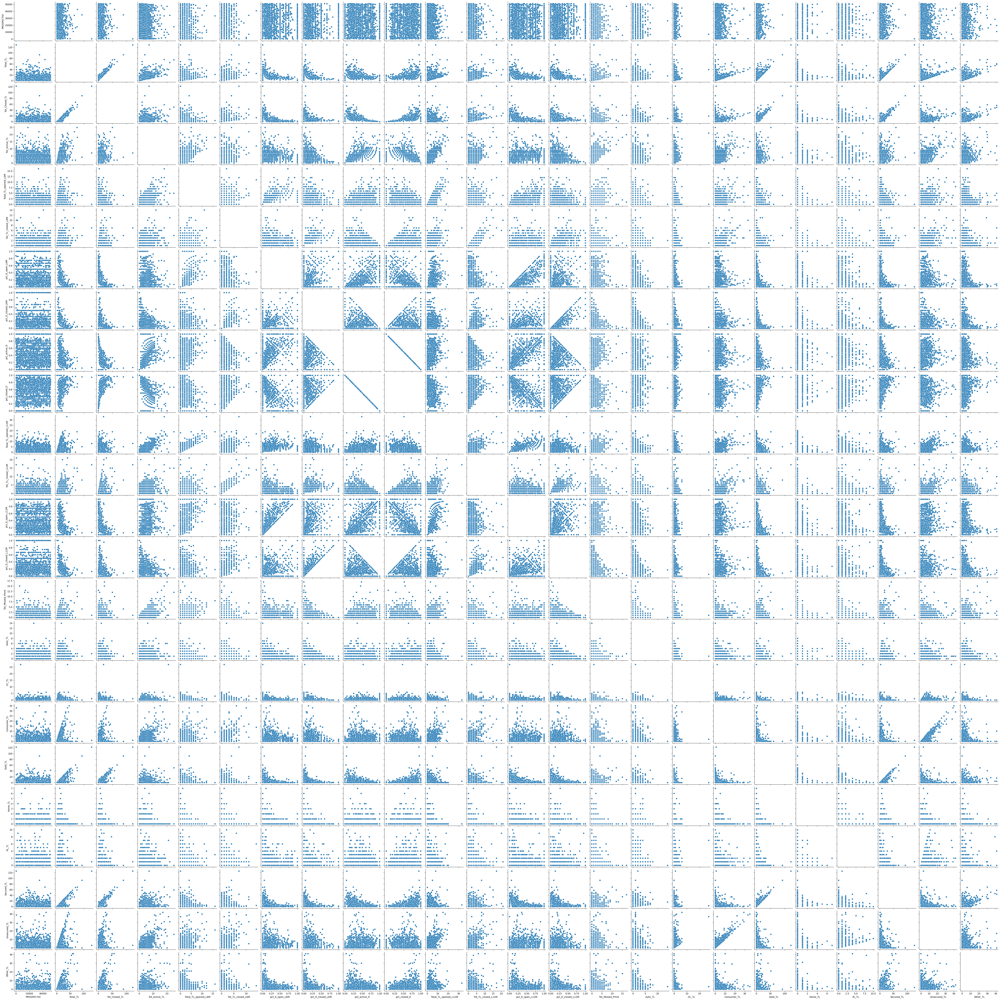

In [32]:
sns.pairplot(df.sample(frac=0.1), diag_kind='scatter')
plt.show()

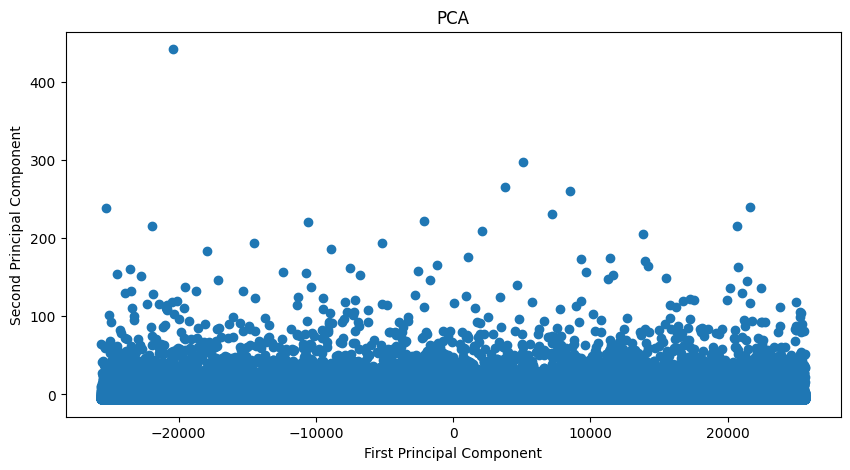

In [34]:
#PCA 
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
transformed = pca.fit_transform(df)
plt.figure(figsize=(10,5))
plt.scatter(transformed[:,0], transformed[:,1])
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA')
plt.show()

## Case Study 2 

In [35]:
df2 = pd.read_excel('Data/case_study2.xlsx')

In [37]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51336 entries, 0 to 51335
Data columns (total 62 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   PROSPECTID                    51336 non-null  int64  
 1   time_since_recent_payment     51336 non-null  int64  
 2   time_since_first_deliquency   51336 non-null  int64  
 3   time_since_recent_deliquency  51336 non-null  int64  
 4   num_times_delinquent          51336 non-null  int64  
 5   max_delinquency_level         51336 non-null  int64  
 6   max_recent_level_of_deliq     51336 non-null  int64  
 7   num_deliq_6mts                51336 non-null  int64  
 8   num_deliq_12mts               51336 non-null  int64  
 9   num_deliq_6_12mts             51336 non-null  int64  
 10  max_deliq_6mts                51336 non-null  int64  
 11  max_deliq_12mts               51336 non-null  int64  
 12  num_times_30p_dpd             51336 non-null  int64  
 13  n

In [42]:
df2.describe()

,PROSPECTID,time_since_recent_payment,time_since_first_deliquency,time_since_recent_deliquency,num_times_delinquent,max_delinquency_level,max_recent_level_of_deliq,num_deliq_6mts,num_deliq_12mts,num_deliq_6_12mts,...,PL_utilization,PL_Flag,pct_PL_enq_L6m_of_L12m,pct_CC_enq_L6m_of_L12m,pct_PL_enq_L6m_of_ever,pct_CC_enq_L6m_of_ever,max_unsec_exposure_inPct,HL_Flag,GL_Flag,Credit_Score
count,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,...,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000,51336.000000
mean,25668.500000,-8129.961314,-70020.091320,-70022.375838,1.573749,-70003.987085,13.521953,0.184977,0.480053,0.295076,...,-86556.225194,0.167874,0.190414,0.065182,0.170492,0.056302,-45127.943635,0.271116,0.052887,679.859222
std,14819.571046,27749.328514,45823.312757,45819.820741,4.165012,45847.976100,53.336976,0.710240,1.522210,1.027471,...,34111.414750,0.373758,0.376218,0.235706,0.350209,0.213506,49795.784556,0.444540,0.223810,20.502764
min,1.000000,-99999.000000,-99999.000000,-99999.000000,0.000000,-99999.000000,0.000000,0.000000,0.000000,0.000000,...,-99999.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-99999.000000,0.000000,0.000000,469.000000
25%,12834.750000,46.000000,-99999.000000,-99999.000000,0.000000,-99999.000000,0.000000,0.000000,0.000000,0.000000,...,-99999.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-99999.000000,0.000000,0.000000,669.000000
50%,25668.500000,70.000000,-99999.000000,-99999.000000,0.000000,-99999.000000,0.000000,0.000000,0.000000,0.000000,...,-99999.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.333000,0.000000,0.000000,680.000000
75%,38502.250000,161.000000,8.000000,3.000000,1.000000,15.000000,10.000000,0.000000,0.000000,0.000000,...,-99999.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.164250,1.000000,0.000000,691.000000
max,51336.000000,6065.000000,35.000000,35.000000,74.000000,900.000000,900.000000,12.000000,28.000000,20.000000,...,1.708000,1.000000,1.000000,1.000000,1.000000,1.000000,173800.000000,1.000000,1.000000,811.000000


In [43]:
df2.isnull().sum()

PROSPECTID                      0
time_since_recent_payment       0
time_since_first_deliquency     0
time_since_recent_deliquency    0
num_times_delinquent            0
                               ..
GL_Flag                         0
last_prod_enq2                  0
first_prod_enq2                 0
Credit_Score                    0
Approved_Flag                   0
Length: 62, dtype: int64

In [40]:
df.isna().sum()

PROSPECTID              0
Total_TL                0
Tot_Closed_TL           0
Tot_Active_TL           0
Total_TL_opened_L6M     0
Tot_TL_closed_L6M       0
pct_tl_open_L6M         0
pct_tl_closed_L6M       0
pct_active_tl           0
pct_closed_tl           0
Total_TL_opened_L12M    0
Tot_TL_closed_L12M      0
pct_tl_open_L12M        0
pct_tl_closed_L12M      0
Tot_Missed_Pmnt         0
Auto_TL                 0
CC_TL                   0
Consumer_TL             0
Gold_TL                 0
Home_TL                 0
PL_TL                   0
Secured_TL              0
Unsecured_TL            0
Other_TL                0
dtype: int64

In [44]:
df2.duplicated().sum()  

np.int64(0)

array([[<Axes: title={'center': 'PROSPECTID'}>,
        <Axes: title={'center': 'time_since_recent_payment'}>,
        <Axes: title={'center': 'time_since_first_deliquency'}>,
        <Axes: title={'center': 'time_since_recent_deliquency'}>,
        <Axes: title={'center': 'num_times_delinquent'}>,
        <Axes: title={'center': 'max_delinquency_level'}>,
        <Axes: title={'center': 'max_recent_level_of_deliq'}>],
       [<Axes: title={'center': 'num_deliq_6mts'}>,
        <Axes: title={'center': 'num_deliq_12mts'}>,
        <Axes: title={'center': 'num_deliq_6_12mts'}>,
        <Axes: title={'center': 'max_deliq_6mts'}>,
        <Axes: title={'center': 'max_deliq_12mts'}>,
        <Axes: title={'center': 'num_times_30p_dpd'}>,
        <Axes: title={'center': 'num_times_60p_dpd'}>],
       [<Axes: title={'center': 'num_std'}>,
        <Axes: title={'center': 'num_std_6mts'}>,
        <Axes: title={'center': 'num_std_12mts'}>,
        <Axes: title={'center': 'num_sub'}>,
        <A

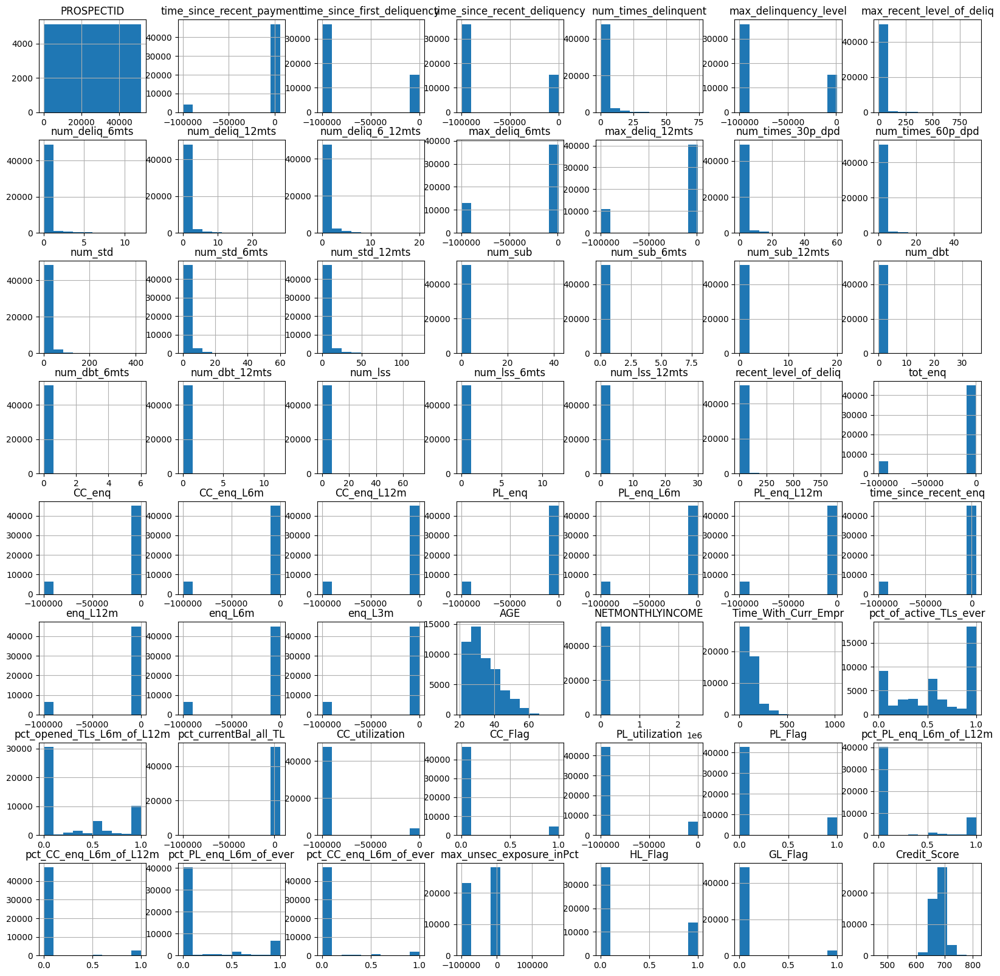

In [45]:
df2.hist(figsize=(20,20))

/var/folders/g7/bbd_jzjd06dgnv3jh42k45l80000gn/T/ipykernel_66448/3175240987.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))


TypeError: ufunc 'divide' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

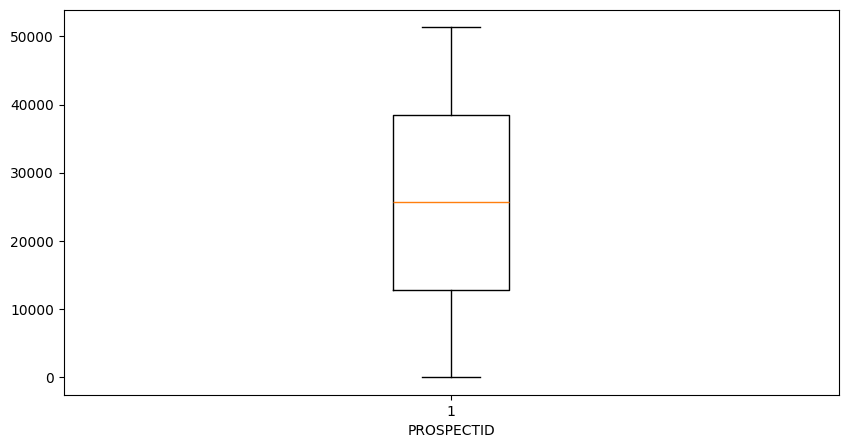

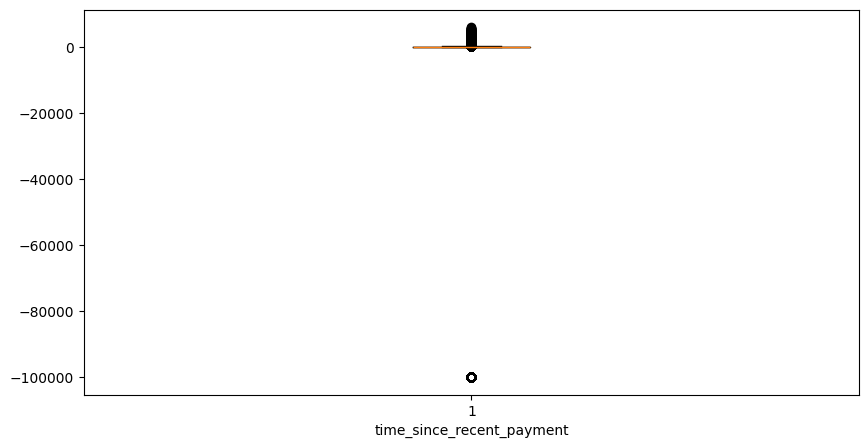

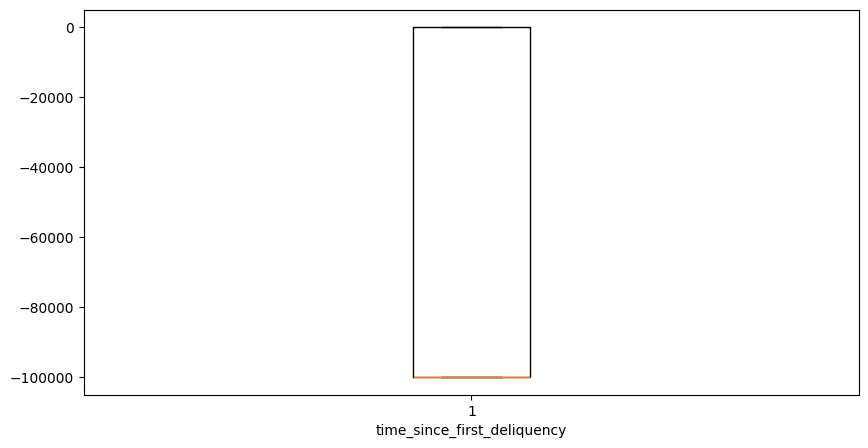

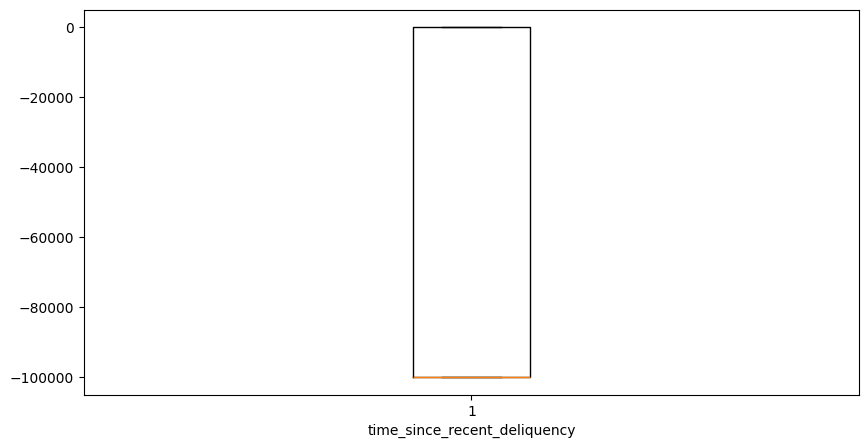

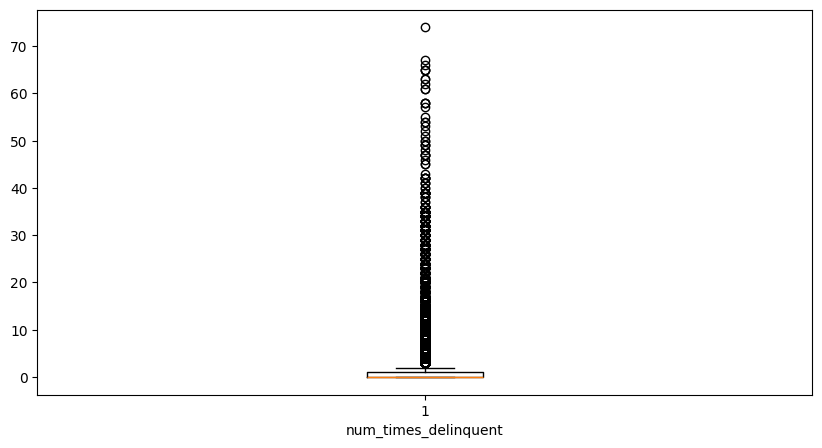

...

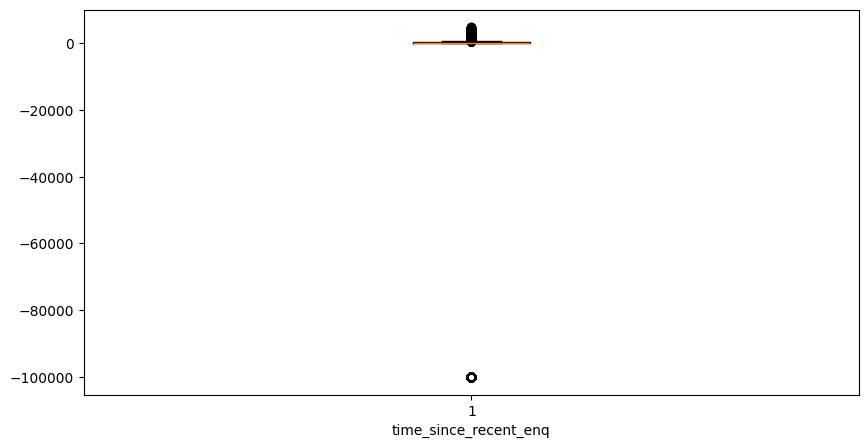

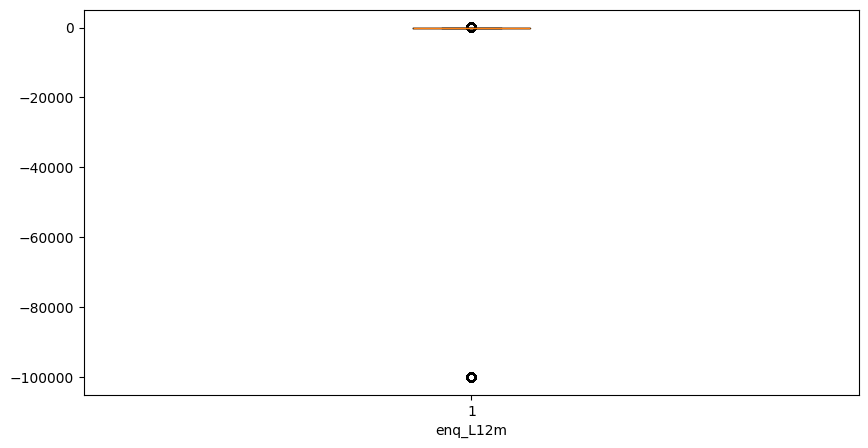

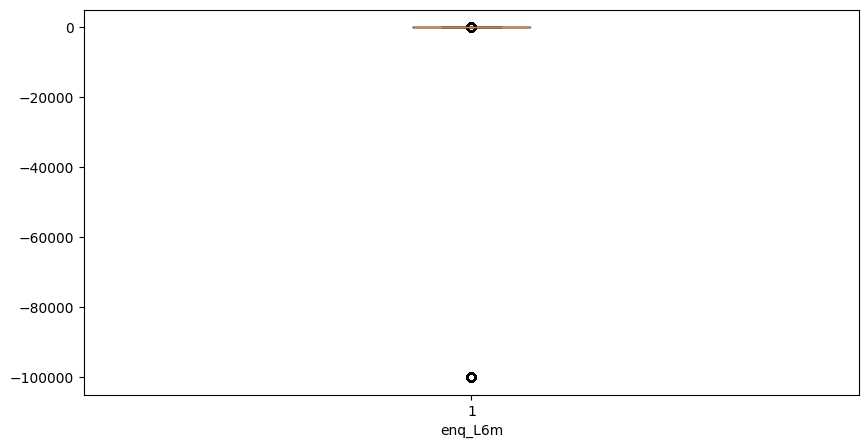

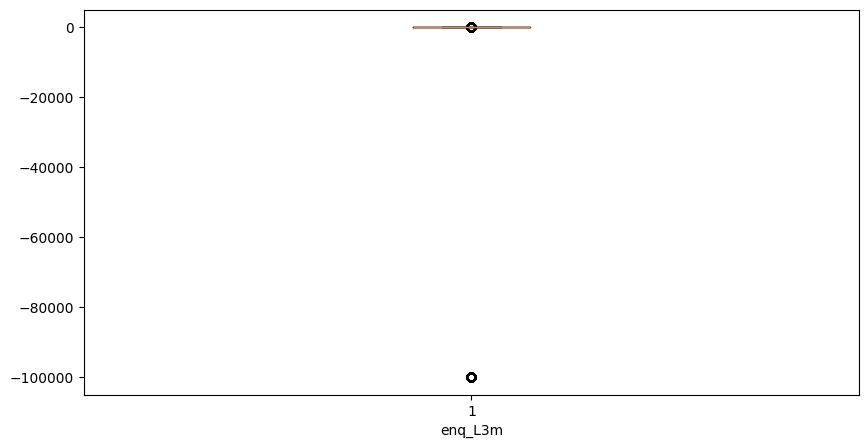

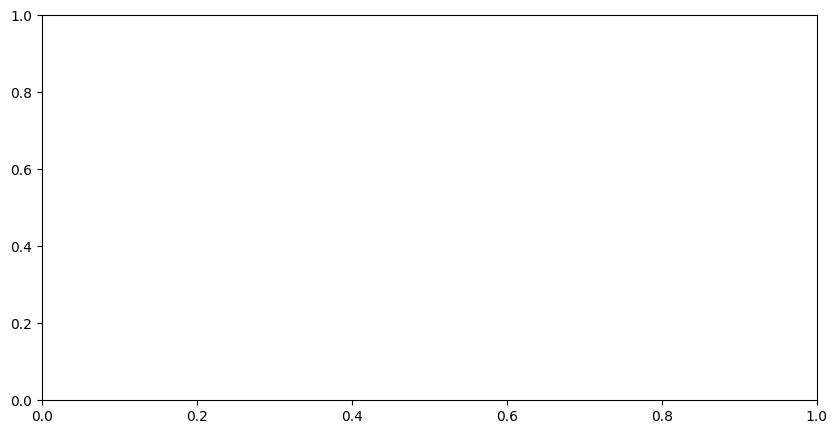

In [47]:
uniques = df2.columns.to_list()
for i in uniques:
    plt.figure(figsize=(10,5))
    plt.boxplot(df2[i])
    plt.xlabel(i)
#df.boxplot(column=['Total_TL'] , figsize=(20,20))

<Axes: >

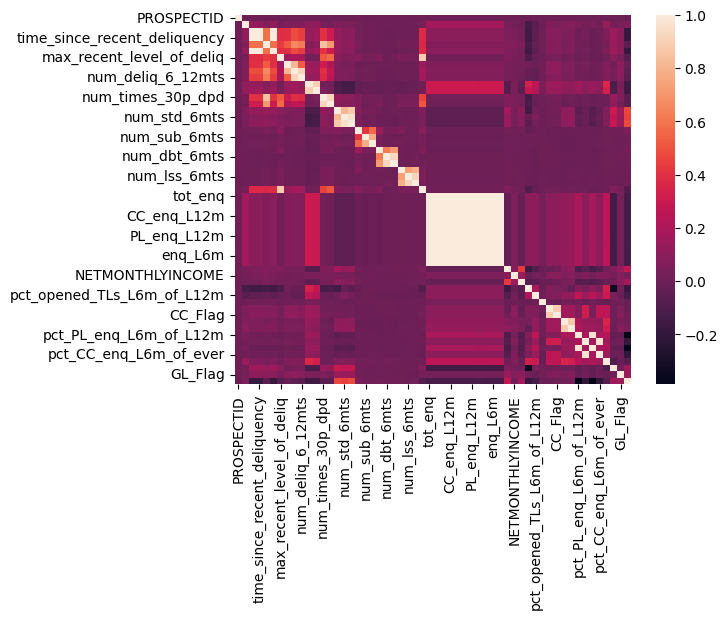

In [58]:
numeric_variable = df2.select_dtypes(include=['int64','float64']).columns
sns.heatmap(df2[numeric_variable].corr(), annot=False)

In [61]:
correlation = df2[numeric_variable].corr()


,PROSPECTID,time_since_recent_payment,time_since_first_deliquency,time_since_recent_deliquency,num_times_delinquent,max_delinquency_level,max_recent_level_of_deliq,num_deliq_6mts,num_deliq_12mts,num_deliq_6_12mts,...,PL_utilization,PL_Flag,pct_PL_enq_L6m_of_L12m,pct_CC_enq_L6m_of_L12m,pct_PL_enq_L6m_of_ever,pct_CC_enq_L6m_of_ever,max_unsec_exposure_inPct,HL_Flag,GL_Flag,Credit_Score
PROSPECTID,1.000000,-0.003485,-0.001128,-0.001128,-0.001522,-0.001127,0.007504,0.000265,-0.001400,-0.002258,...,-0.004012,-0.001352,0.003666,0.006387,0.002112,0.006415,-0.002104,0.003321,-0.000242,-0.008003
time_since_recent_payment,-0.003485,1.000000,0.118118,0.118117,0.069618,0.118095,0.036128,0.055453,0.064435,0.057129,...,0.070155,0.081965,0.048313,0.025367,0.040395,0.018106,0.134706,0.024691,0.030551,0.056669
time_since_first_deliquency,-0.001128,0.118118,1.000000,1.000000,0.577600,0.999999,0.387537,0.398079,0.482031,0.438963,...,0.053792,0.066428,0.008183,0.019388,-0.013044,0.003448,0.058490,0.165237,0.100353,-0.186691
time_since_recent_deliquency,-0.001128,0.118117,1.000000,1.000000,0.577533,0.999999,0.387515,0.398035,0.481984,0.438923,...,0.053788,0.066423,0.008182,0.019387,-0.013043,0.003448,0.058488,0.165230,0.100345,-0.186704
num_times_delinquent,-0.001522,0.069618,0.577600,0.577533,1.000000,0.578033,0.432593,0.520053,0.654339,0.609924,...,0.036972,0.057367,0.008395,0.017869,-0.013258,0.000915,0.034278,0.144881,0.098119,-0.053259
max_delinquency_level,-0.001127,0.118095,0.999999,0.999999,0.578033,1.000000,0.388608,0.398122,0.482112,0.439052,...,0.053755,0.066405,0.008165,0.019374,-0.013063,0.003433,0.058466,0.165318,0.100348,-0.186701
max_recent_level_of_deliq,0.007504,0.036128,0.387537,0.387515,0.432593,0.388608,1.000000,0.167681,0.210392,0.195789,...,0.010792,0.025083,-0.003199,-0.000083,-0.012337,-0.008579,0.011759,0.104918,0.040452,-0.066512
num_deliq_6mts,0.000265,0.055453,0.398079,0.398035,0.520053,0.398122,0.167681,1.000000,0.816674,0.518661,...,0.040883,0.052165,0.016036,0.030026,-0.000630,0.017399,0.065010,0.017244,0.096296,-0.014668
num_deliq_12mts,-0.001400,0.064435,0.482031,0.481984,0.654339,0.482112,0.210392,0.816674,1.000000,0.916986,...,0.043749,0.055772,0.015876,0.028520,-0.004576,0.012443,0.073391,0.030763,0.105818,-0.048703
num_deliq_6_12mts,-0.002258,0.057129,0.438963,0.438923,0.609924,0.439052,0.195789,0.518661,0.916986,1.000000,...,0.036554,0.046568,0.012436,0.021497,-0.006344,0.006408,0.063792,0.033656,0.090206,-0.062014


In [ ]:
pd.plotting.scatter_matrix(df2[numeric_variable], figsize=(20,20))

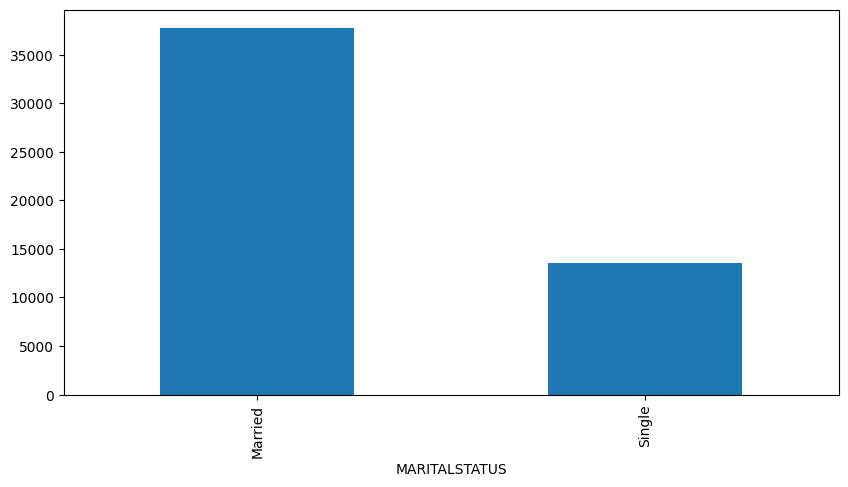

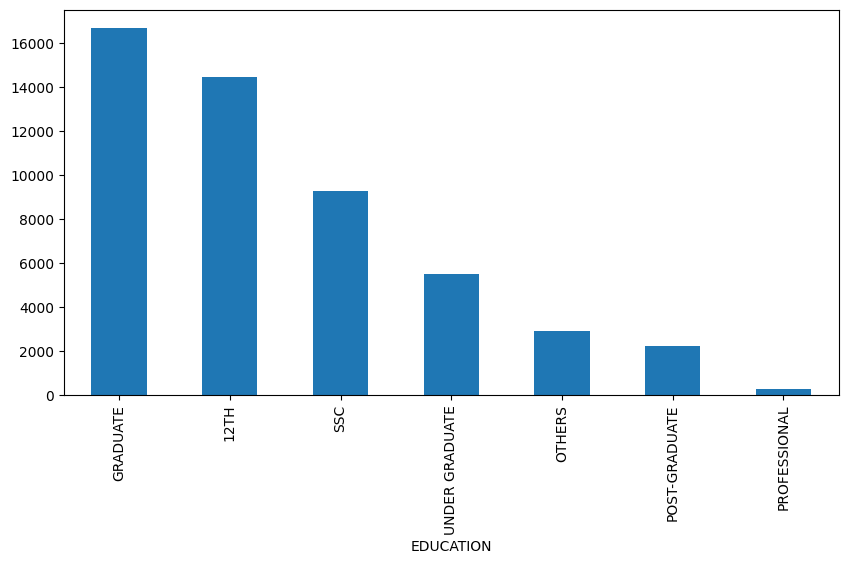

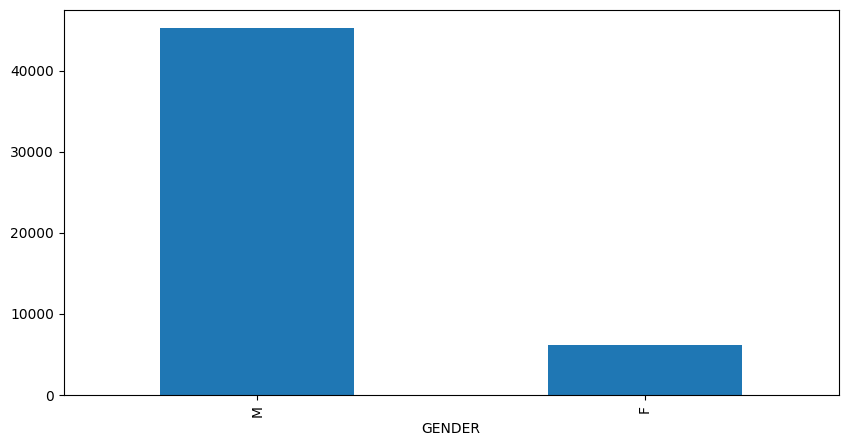

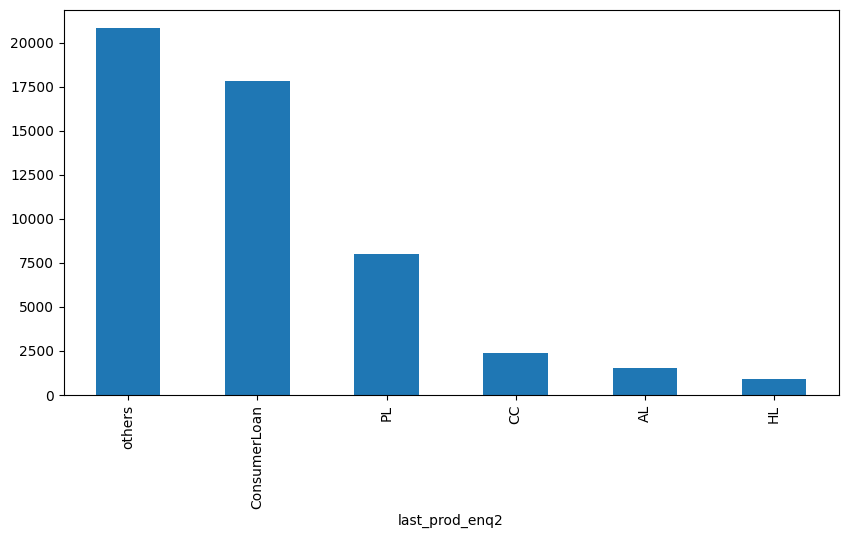

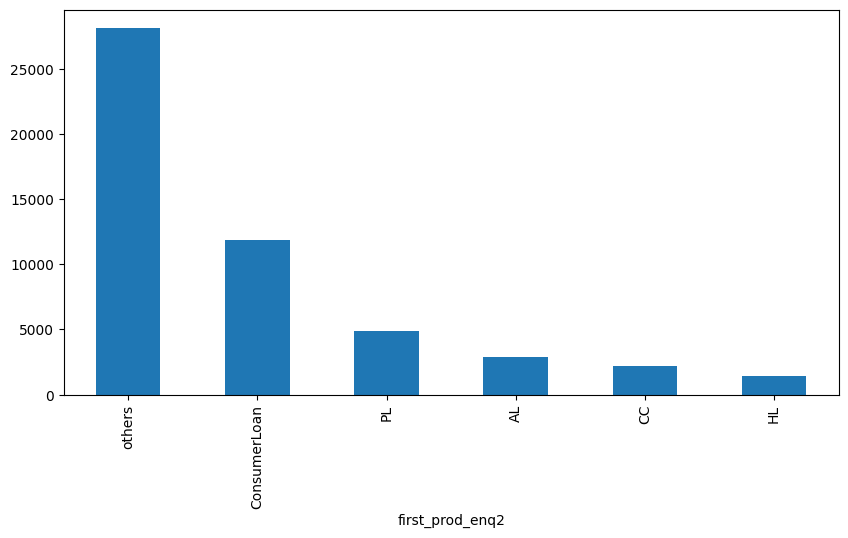

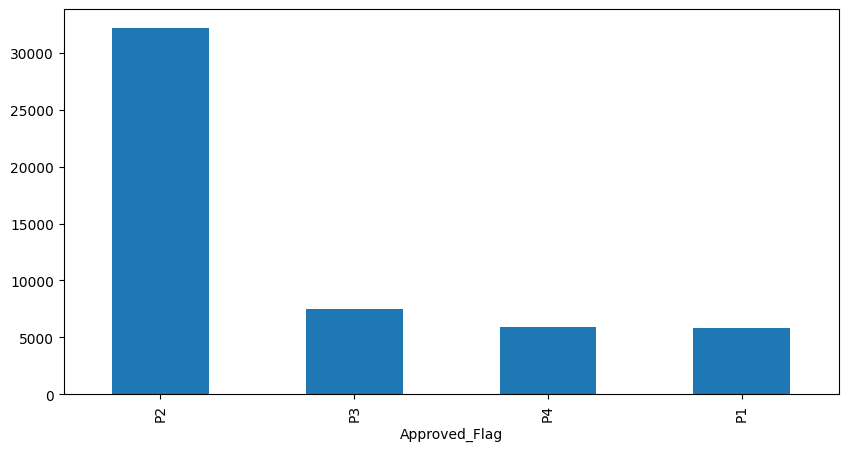

In [55]:
categorical_Variable = df2.select_dtypes(include=['object']).columns
categorical_Variable
for i in categorical_Variable:
    plt.figure(figsize=(10,5))
    df2[i].value_counts().plot(kind='bar')